# Read sea ice data and orbital parameters

In [1]:
import pandas as pd
import numpy as np

# load orbital parameters
path='D:/VScode/EBM_NH_SH_sea_ice/orb_paras/'
# read the Pre_0_1Ma_inter100.txt, which does not have columns names
df_pre=pd.read_csv(path+'Pre_0_1Ma_inter100.txt',sep='\s+',header=None)
# rename the columns
df_pre.columns=['age','pre']

df_obl=pd.read_csv(path+'Obl_0_1Ma_inter100.txt',sep='\s+',header=None)
df_obl.columns=['age','obl']


df_pre['age']=df_pre['age']*-1
df_obl['age']=df_obl['age']*-1
# filp the columns up-down
df_pre=df_pre[::-1]
df_obl=df_obl[::-1]



# import pandas as pd

# # load orbital parameters
# path='D:/VScode/EBM_NH_SH_sea_ice/orb_paras/'
# df_ecc=pd.read_csv(path+'df_ecc.csv')
# df_pre=pd.read_csv(path+'df_pre.csv')
# df_obl=pd.read_csv(path+'df_obl.csv')

# # age /1000
# df_ecc['age']=df_ecc['age']/1000
# df_pre['age']=df_pre['age']/1000
# df_obl['age']=df_obl['age']/1000

# # # # crop the orbital parameters for age<=200
# df_ecc=df_ecc[df_ecc['age']<=800]
# df_pre=df_pre[df_pre['age']<=800]
# df_obl=df_obl[df_obl['age']<=800]



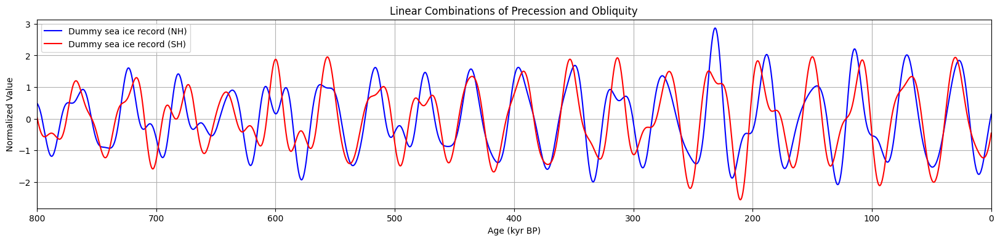

In [9]:
import numpy as np
from scipy.stats import zscore
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# Create figure and axis
plt.figure(figsize=(20, 4))

# Plot NH and SH linear combinations
plt.plot(df_pre['age'], linear_comb_nh, label='Dummy sea ice record (NH)', color='blue')
plt.plot(df_pre['age'], linear_comb_sh, label='Dummy sea ice record (SH)', color='red')

# Set labels and title
plt.xlabel('Age (kyr BP)')
plt.ylabel('Normalized Value')
plt.title('Linear Combinations of Precession and Obliquity')
plt.legend()

# set x-axis range
plt.xlim(0, 800)
# invert the x-axis
plt.gca().invert_xaxis()
# Show plot
plt.grid(True)
plt.show()


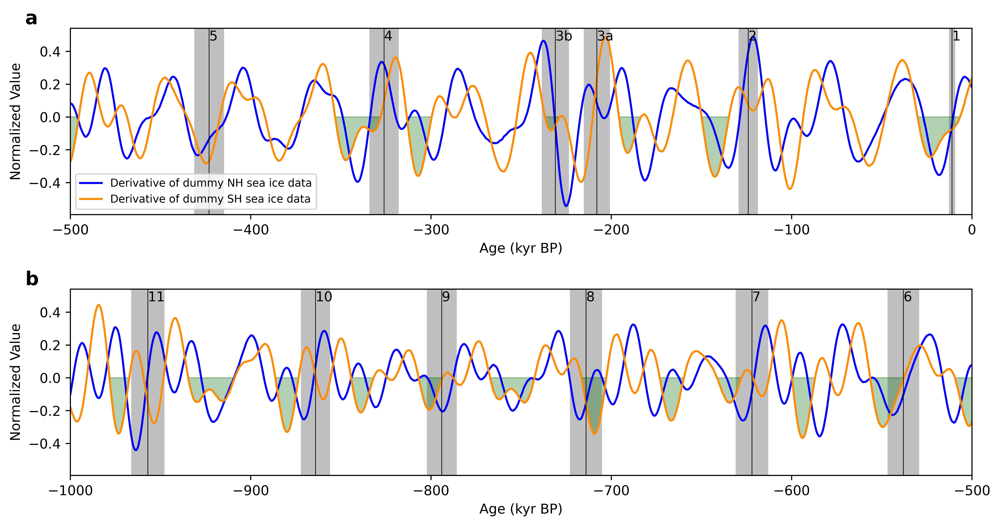

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)

# Create figure and subplots with 3 rows
fig, axs = plt.subplots(2, 1, figsize=(12, 6), dpi=600)


axs[0].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[0].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='darkgreen', alpha=0.3)
# set x-axis range
axs[0].set_xlim(-500,0)
axs[0].legend(fontsize=8)

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='darkorange')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='darkgreen', alpha=0.3)
# set x-axis range
axs[1].set_xlim(-1000,-500)
# axs[1].legend()

# plot labels for Tt

for i in range(6):
    axs[0].text(Tt[i+6], 0.45, Tt_labels[i+6], fontsize=10, verticalalignment='bottom', horizontalalignment='left')
    axs[1].text(Tt[i], 0.45, Tt_labels[i], fontsize=10, verticalalignment='bottom', horizontalalignment='left')


for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[0].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[0].axvline(x=t, color='black', linestyle='-', linewidth=0.5)

    axs[1].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[1].axvline(x=t, color='black', linestyle='-', linewidth=0.5)



# Set common labels and legend for the middle and bottom subplots
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Normalized Value')
    # ax.set_ylabel('Derivative of Linear Combination')
    # ax.legend()
    # ax.set_xlim(-1000, 0)

# add text a and b to the subplots with bold font
axs[0].text(-0.05, 1.1, 'a', transform=axs[0].transAxes, fontsize=14, fontweight='bold', va='top')
axs[1].text(-0.05, 1.1, 'b', transform=axs[1].transAxes, fontsize=14, fontweight='bold', va='top')


# adjust vertical space between subplots
plt.subplots_adjust(hspace=0.4)
# Adjust layout
# plt.tight_layout()
plt.show()


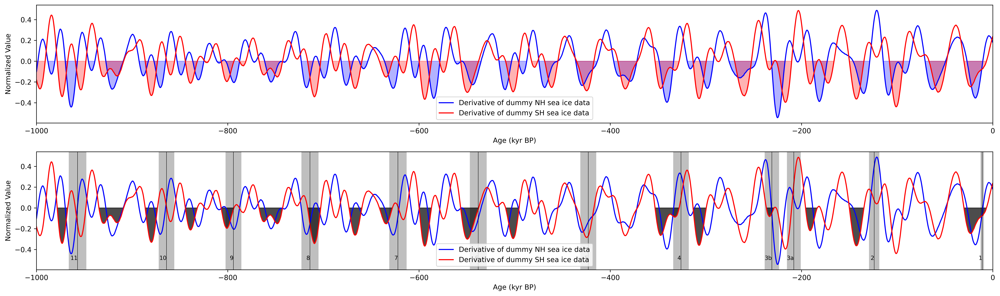

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)

# Create figure and subplots with 3 rows
fig, axs = plt.subplots(2, 1, figsize=(20, 6), dpi=600)


# Middle subplot for derivatives
axs[0].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1 * df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1 * df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
# axs[0].set_title('Negative Derivatives')

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)

i=0
for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[1].text(t, -0.5, Tt_labels[i], fontsize=8, ha='right')
    # add vertical lines at Tt
    axs[1].axvline(x=t, color='black', linestyle='-', linewidth=0.5)
    i+=1



# Set common labels and legend for the middle and bottom subplots
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Normalized Value')
    # ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-1000, 0)

# Adjust layout
plt.tight_layout()
plt.show()


In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Assuming df_pre and df_obl are already defined and loaded as in your previous code snippets

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt = np.array([-957, -864, -794, -714, -622, -538, -423, -326, -231, -208, -124, -11])
Tt_unc_sigleside = np.array([9.19599874163397, 8.11472231168675, 8.29531938444627, 8.90935954302480, 9.05842898966959, 8.80897810886163, 8.31862132608857, 8.17091882229411, 7.55216739617228, 7.25855162019460, 5.37345911115918, 1.77207101844172])
Tt_labels=['11','10','9','8','7','6','5','4','3b','3a','2','1']

# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1 * df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1 * df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)

# Create figure and subplots with 3 rows
fig, axs = plt.subplots(3, 1, figsize=(20, 12), dpi=600)

# New top subplot for Linear Combinations of Precession and Obliquity
axs[0].plot(df_pre['age'], linear_comb_nh, label='Dummy sea ice record (NH)', color='blue')
axs[0].plot(df_pre['age'], linear_comb_sh, label='Dummy sea ice record (SH)', color='red')
axs[0].set_xlabel('Age (kyr BP)')
axs[0].set_ylabel('Normalized Value')
axs[0].set_title('Linear Combinations of Precession and Obliquity')
axs[0].legend()
axs[0].set_xlim(0, 800)
axs[0].invert_xaxis()
# axs[0].grid(True)

# Middle subplot for derivatives
axs[1].plot(-1 * df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[1].plot(-1 * df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[1].fill_between(-1 * df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[1].fill_between(-1 * df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[1].set_title('Negative Derivatives')

# Bottom subplot for derivatives with highlighted sections
# Assuming the code to calculate sh_lead_indices is correct and included before this plot code
axs[2].plot(-1 * df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[2].plot(-1 * df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')
# This assumes `sh_lead_indices` calculation is correctly defined elsewhere in your code
axs[2].fill_between(-1 * df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)

i=0
for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[2].axvspan(t - unc, t + unc, color='gray', alpha=0.5, zorder=0, linewidth=0)
    axs[2].text(t, -0.5, Tt_labels[i], fontsize=8, ha='right')
    # add vertical lines at Tt
    axs[2].axvline(x=t, color='black', linestyle='-', linewidth=0.5)
    i+=1



# Set common labels and legend for the middle and bottom subplots
for ax in axs[1:]:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800, 0)

# Adjust layout
plt.tight_layout()
plt.show()


In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# # timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt=np.array([-957,-864,-794,-714,-622,-538,-423,-326,-231,-208,-124,-11])
Tt_unc_sigleside=np.array([9.19599874163397,8.11472231168675,8.29531938444627,8.90935954302480,9.05842898966959,8.80897810886163,8.31862132608857,8.17091882229411,7.55216739617228,7.25855162019460,5.37345911115918,1.77207101844172])


# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1*df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1*df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 8),dpi=600)

# Plot derivatives in the first subplot
axs[0].plot(-1*df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1*df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1*df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1*df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[0].set_title('Negative Derivatives')

neg_chunks_nh=np.split(neg_indices_nh, np.where(np.diff(neg_indices_nh) != 1)[0] + 1)
neg_chunks_sh=np.split(neg_indices_sh, np.where(np.diff(neg_indices_sh) != 1)[0] + 1)

sh_lead_indices = []

for chunk_sh in neg_chunks_sh:
    for chunk_nh in neg_chunks_nh:
        left_index = chunk_nh[-1]+1
        if left_index in chunk_sh:
            sh_lead_indices.append(chunk_sh)

sh_lead_indices = np.concatenate(sh_lead_indices)


axs[1].plot(-1*df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[1].plot(-1*df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')
axs[1].fill_between(-1*df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), sh_lead_indices), color='k', alpha=0.7)


for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t-unc, t+unc, color='gray', alpha=0.5,zorder=0,linewidth=0)

# Set common labels and legend
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800,0)

# Show plot
plt.tight_layout()
plt.show()



In [33]:
chunks

[array([105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
        118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
        131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
        144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
        157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
        170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
        183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
        196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208,
        209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,
        222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234,
        235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247,
        248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260,
        261, 262, 263, 264, 265, 266, 267, 268, 269], dtype=int64),
 array([494, 495, 496, 497, 498, 499, 500, 501, 502, 503

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Define the coefficients for NH and SH
coe_pre_nh = 0.4
coe_obl_nh = -0.9
coe_pre_sh = -0.4
coe_obl_sh = -0.9

# Create linear combinations for NH and SH
linear_comb_nh = coe_pre_nh * zscore(df_pre['pre']) + coe_obl_nh * zscore(df_obl['obl'])
linear_comb_sh = coe_pre_sh * zscore(df_pre['pre']) + coe_obl_sh * zscore(df_obl['obl'])

# # timing of the terminations, data from Huybers et al., 2011 doi:10.1038/nature10626
Tt=np.array([-957,-864,-794,-714,-622,-538,-423,-326,-231,-208,-124,-11])
Tt_unc_sigleside=np.array([9.19599874163397,8.11472231168675,8.29531938444627,8.90935954302480,9.05842898966959,8.80897810886163,8.31862132608857,8.17091882229411,7.55216739617228,7.25855162019460,5.37345911115918,1.77207101844172])


# Calculate derivatives
deriv_nh = np.gradient(linear_comb_nh, -1*df_pre['age'])  # Negate age axis for paleoclimate records
deriv_sh = np.gradient(linear_comb_sh, -1*df_pre['age'])

# Find where derivatives are negative
neg_indices_nh = np.where(deriv_nh < 0)[0]
neg_indices_sh = np.where(deriv_sh < 0)[0]

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 8),dpi=600)

# Plot derivatives in the first subplot
axs[0].plot(-1*df_pre['age'], deriv_nh, label='Derivative of dummy NH sea ice data', color='blue')
axs[0].plot(-1*df_pre['age'], deriv_sh, label='Derivative of dummy SH sea ice data', color='red')
axs[0].fill_between(-1*df_pre['age'], deriv_nh, where=deriv_nh < 0, color='blue', alpha=0.3)
axs[0].fill_between(-1*df_pre['age'], deriv_sh, where=deriv_sh < 0, color='red', alpha=0.3)
axs[0].set_title('Negative Derivatives')

# Find overlapping negative areas
overlapping_indices = np.intersect1d(neg_indices_nh, neg_indices_sh)

# Find consecutive chunks of overlapping indices
chunks = np.split(overlapping_indices, np.where(np.diff(overlapping_indices) != 1)[0] + 1)

# Find indices where SH derivative negative phase comes earlier than NH within each chunk
early_sh_indices = []
for chunk in chunks:
    left_index = chunk[-1]+1
    # print(left_index)
    if left_index in neg_indices_sh and left_index not in neg_indices_nh:
        early_sh_indices.append(chunk)

# reshape early_sh_indices to 1D array
early_sh_indices = np.concatenate(early_sh_indices)

# # Plot overlapping negative areas in the second subplot
axs[1].plot(-1*df_pre['age'], deriv_nh, label='Derivative (NH)', color='blue')
axs[1].plot(-1*df_pre['age'], deriv_sh, label='Derivative (SH)', color='red')

axs[1].fill_between(-1*df_pre['age'], deriv_nh, where=np.isin(np.arange(len(deriv_nh)), overlapping_indices), color='green', alpha=0.3)
axs[1].fill_between(-1*df_pre['age'], deriv_sh, where=np.isin(np.arange(len(deriv_sh)), early_sh_indices), color='k', alpha=0.7)

# plt.plot(-1*df_pre['age'], linear_comb_nh, label='Dummy NH sea ice data', color='blue')
# plt.plot(-1*df_pre['age'], linear_comb_sh, label='Dummy SH sea ice data', color='red')
# axs[1].fill_between(-1*df_pre['age'], linear_comb_sh, where=np.isin(np.arange(len(deriv_sh)), early_sh_indices), color='k', alpha=0.7)

axs[1].set_title('Overlapping Negative Derivatives')

#

for t, unc in zip(Tt, Tt_unc_sigleside):
    axs[1].axvspan(t-unc, t+unc, color='gray', alpha=0.5,zorder=0,linewidth=0)

# Set common labels and legend
for ax in axs:
    ax.set_xlabel('Age (kyr BP)')
    ax.set_ylabel('Derivative of Linear Combination')
    ax.legend()
    ax.set_xlim(-800,0)

# Show plot
plt.tight_layout()
plt.show()

